# YOLOv5 applied to James Webb Space Telescope (JWST) Image

On Tuesday, July 12, 2022, the first images from NASA's James Webb Space Telescope were released worldwide. Without doubt, this ushers in a new era for data analysis in astronomy, involving studies related to the physics of black holes, celestial bodies and even the origin of the universe.

Taking advantage of the unprecedented images obtained from the world's largest and most powerful space telescope, I was curious on how would behave on one of the best, deep learning real-time detectors. I applied a YOLOv5, a single-stage deep learning object detector, built by Ultralytics on PyTorch, and with state-of-the-art accuracy.

This project was simply a basic approach, without the intention of optimization, but for pure exploration. It presents a number of opportunities for improvement, which I will list later. Still showed a very interesting initial approach, for only star detection.

The analysis performed here employed:
- Source of images: [James Webb Space Telescope](https://www.nasa.gov/webbfirstimages)
- [LabelImg](https://github.com/tzutalin/labelImg) framework for computer vision annotation
- [Roboflow](https://roboflow.com/) for image streamlining, format conversion, and training, validation and testing sets formation
- [YOLOv5](https://github.com/ultralytics/yolov5) deep network

# Requirements Installation

In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

[Errno 2] No such file or directory: 'yolov5'
/content/yolov5
Setup complete. Using torch 1.12.0+cu113 (Tesla T4)


# Image Annotation and Streamlining

Here we can see the result of the images, after the annotation and streamlining stages, from Roboflow website.

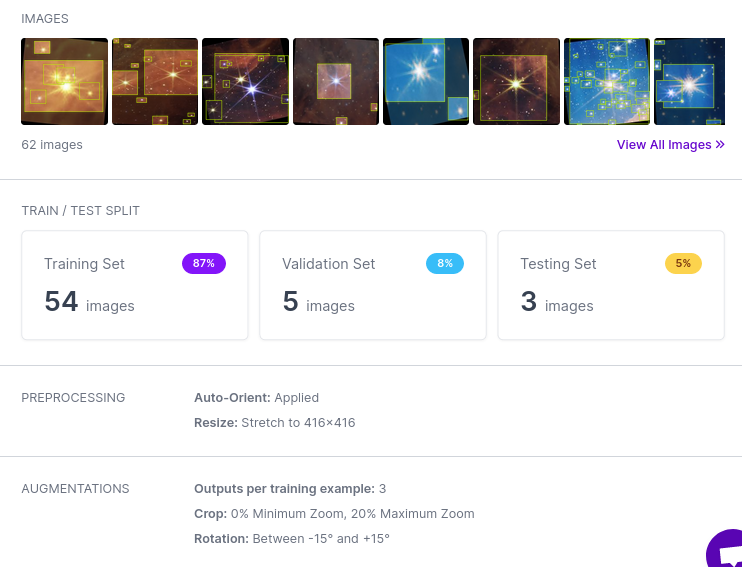

In [4]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [5]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [6]:
#after following the link above, recieve python code with these fields filled in

from roboflow import Roboflow
rf = Roboflow(api_key=API_KEY)
project = rf.workspace("silas-data").project("jwst-stars")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/JWST-stars-1 in yolov5pytorch:: 100%|██████████| 136/136 [00:00<00:00, 1948.56it/s]


# Train YOLOv5 model

We have some hyperparameters:

- img: define input image size
- batch: determine batch size
- epochs: define the number of training epochs
- weights: initial weights of the network

In [7]:
!python train.py --img 416 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/JWST-stars-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-295-gf8722b4 Python-3.7.13 torch-1.11.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=

# Evaluate YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile.

In [8]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
#%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir /content/yolov5/runs

<IPython.core.display.Javascript object>

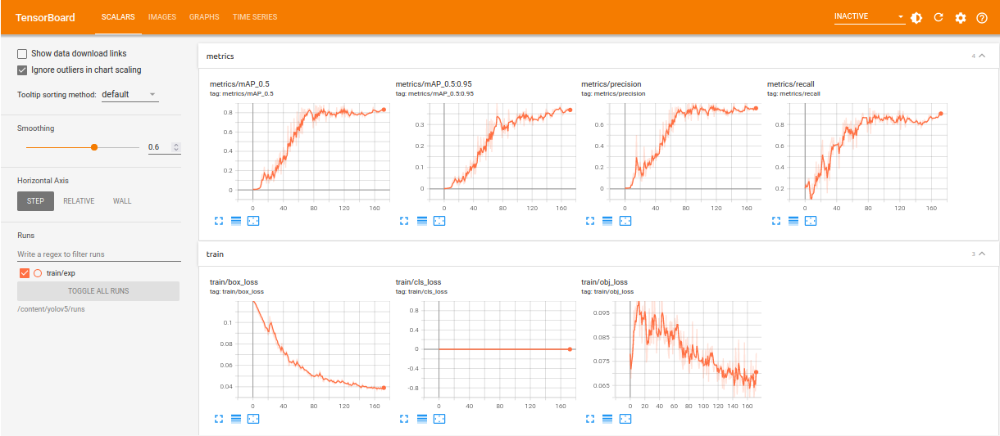

# Run Inference  With Trained Weights

Run inference with the best pretrained checkpoint on the test set.

In [10]:
!cp /content/drive/MyDrive/main_image_star-forming_region_carina_nircam_final-5mb.jpg /content/datasets/JWST-stars-1/test/images

In [20]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images --hide-labels --hide-conf

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/JWST-stars-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-295-gf8722b4 Python-3.7.13 torch-1.11.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/4 /content/datasets/JWST-stars-1/test/images/000_png.rf.4ae0a50400036394796e15cbbc57ca5e.jpg: 416x416 19 stars, Done. (0.009s)
image 2/4 /content/datasets/JWST-stars-1/test/images/003_png.rf.16499f5a19b37fe576efb1d5121f51fd.jpg: 416x416 9 stars, Done. (0.009s)
image 3/4 /content/datasets/JWST-stars-1/test/images/02

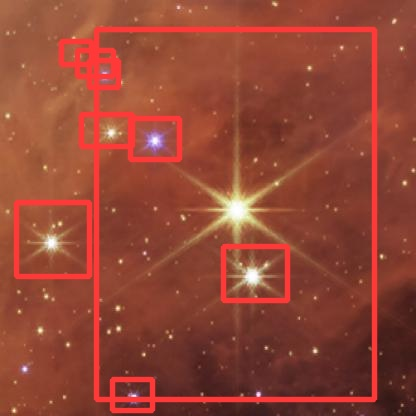

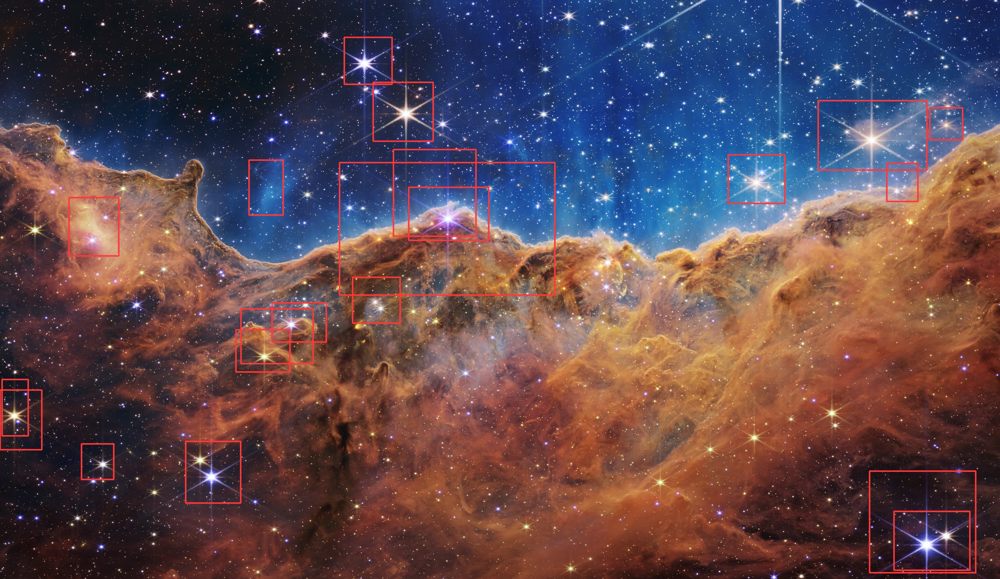

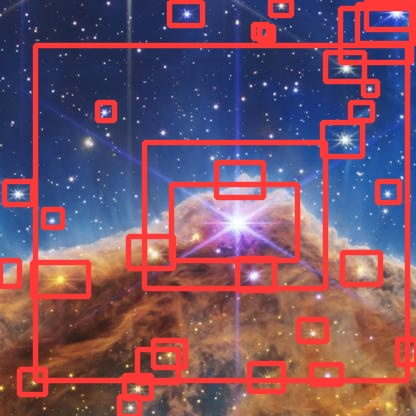

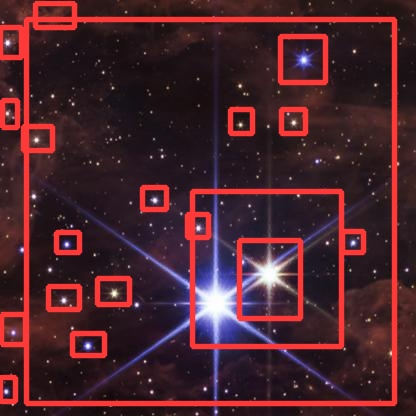

In [21]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Future Works

This study presents a series of future improvements:

- I employed the smallest, simpler model of the family, YOLOv5n, with only 1.9 million parameters. Other more complex and better models are available, up to the YOLOv5x, which contains 86.7 million parameters;
- I did not use the raw full quality images, which for sure could improve the performance of the model, but also increase substantially the training time;
- My training set consisted of only 54 images, extracted from the full image. The training and testing sets can be better worked on, and also with more augmentations;
- The initial weights used for the model are the weights on the generic COCO pre-trained checkpoint. These may not the best initial weights for stars detection;
- Multiple classes are possible, for different celestial bodies classification, and not only star detection;
- Other images from the JWST can also be applied to the network.

Overall, even though the YOLOv5 model was not designed to detect stars, it can be adapted and trained for such performance. Here I just applied a simple computational vision approach on the James Webb Space Telescope images, which can be improved much more.